  ## Final Project Submission


* Dennis Aschenbrenner



##                                       HOUSE PRICES PROJECT ###########################


# 1. Step: import packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
import statsmodels.formula.api as smf
from sklearn import preprocessing
from mpl_toolkits.basemap import Basemap

# 2. Step: DATA MINING

In [2]:

data = pd.read_csv('King_County_House_prices_dataset.csv')
data.shape              # size of the dataset
data.describe()         # summary of important statistical values

# COLUMN DESCRIPTION #

# id - unique identified for a house
# dateDate - house was sold
# pricePrice -  is prediction target
# bedroomsNumber -  of Bedrooms/House
# bathroomsNumber -  of bathrooms/bedrooms ???
# sqft_livingsquare -  footage of the home
# sqft_lotsquare -  footage of the lot
# floorsTotal -  floors (levels) in house
# waterfront - House which has a view to a waterfront
# view - Has been viewed
# condition - How good the condition is ( Overall )
# grade - overall grade given to the housing unit, based on King County grading system
# sqft_above - square footage of house apart from basement
# sqft_basement - square footage of the basement
# yr_built - Built Year
# yr_renovated - Year when house was renovated
# zipcode - zip
# lat - Latitude coordinate
# long - Longitude coordinate
# sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
# sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors


,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19221.000000,21534.000000,21597.000000,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007596,0.233863,3.409825,7.657915,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086825,0.765686,0.650546,1.173200,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [3]:
data.shape

(21597, 21)

# 3. Data cleaning (find NaNs or other non-sense values (e.g outliers)) 

In [4]:
# 3. Data cleaning (find NaNs or other non-sense values (e.g outliers))

# convert different data types to float int and datetime

#data['date'] = pd.to_datetime(data['date']).dt.strftime("%Y%m%d")    # convert data to datetime
data.date = data.date.apply(pd.Timestamp)
data = data.replace('?', np.nan)                                     # replace '?' with NaN
data['sqft_basement'] = data['sqft_basement'].astype(float)

  
iszero = (data==0.0).sum()/(len(data))*100  # Zero values in dataframe in %  


isnan = (data.isna().sum())/len(data)*100   # identify NaNs! 

print(isnan.sort_values(ascending=False), iszero.sort_values(ascending=False))


yr_renovated     17.789508
waterfront       11.001528
sqft_basement     2.102144
view              0.291707
sqft_lot15        0.000000
date              0.000000
price             0.000000
bedrooms          0.000000
bathrooms         0.000000
sqft_living       0.000000
sqft_lot          0.000000
floors            0.000000
condition         0.000000
sqft_living15     0.000000
grade             0.000000
sqft_above        0.000000
yr_built          0.000000
zipcode           0.000000
lat               0.000000
long              0.000000
id                0.000000
dtype: float64 view             89.929157
waterfront       88.322452
yr_renovated     78.765569
sqft_basement    59.387878
sqft_lot15        0.000000
date              0.000000
price             0.000000
bedrooms          0.000000
bathrooms         0.000000
sqft_living       0.000000
sqft_lot          0.000000
floors            0.000000
condition         0.000000
sqft_living15     0.000000
grade             0.000000
sqft_above   

In [5]:
# Before using fillna() basement has some NaN-values, but by calculating a difference between 
# sqft_living and sqft_above we get basement area 

data.sqft_basement = data.sqft_living - data.sqft_above

# fill NaN with 0 
data['waterfront'] = data['waterfront'].fillna(0)
data['view'] = data['view'].fillna(0)

# set yr_renovated zeros to nulls, assumption 0 = no renovation has been done
data['yr_renovated'] = data['yr_renovated'].replace(0, np.nan)

iszero = (data==0.0).sum()/(len(data))*100    
isnan = (data.isna().sum())/len(data)*100   

print(isnan.sort_values(ascending=False), iszero.sort_values(ascending=False))

# About 60% of houses without a basement!


yr_renovated     96.555077
sqft_lot15        0.000000
view              0.000000
date              0.000000
price             0.000000
bedrooms          0.000000
bathrooms         0.000000
sqft_living       0.000000
sqft_lot          0.000000
floors            0.000000
waterfront        0.000000
condition         0.000000
sqft_living15     0.000000
grade             0.000000
sqft_above        0.000000
sqft_basement     0.000000
yr_built          0.000000
zipcode           0.000000
lat               0.000000
long              0.000000
id                0.000000
dtype: float64 waterfront       99.323980
view             90.220864
sqft_basement    60.702875
sqft_lot15        0.000000
date              0.000000
price             0.000000
bedrooms          0.000000
bathrooms         0.000000
sqft_living       0.000000
sqft_lot          0.000000
floors            0.000000
condition         0.000000
sqft_living15     0.000000
grade             0.000000
sqft_above        0.000000
yr_built     

In [6]:
nan_ind = data.index[data['yr_renovated'].isna()].tolist()

yr_built_nan = []
for i in nan_ind:
    yr_built_nan.append(data['yr_built'].iloc[i])

yr_built_nan = pd.DataFrame(yr_built_nan)           # list to df
yr_built_nan.describe()                             # the oldest house was built in 1900 

len(nan_ind)/len(data['yr_renovated'])*100          # ~96.6% of missing data in renovated-col


# In the 75 percentile are all houses built before year 1996... the most houses that contain a NaN value 
# in yr_renovated are relatively old. So there is no correlation between construction year and renovating!

condition_nan = []
for i in nan_ind:
    condition_nan.append(data['condition'].iloc[i])

condition_nan = pd.DataFrame(condition_nan)           # list to df
condition_nan.describe()                              # houses without a renovating year date are in a good
                                                       # overall condition ( 75% > cond=3)


,0
count,20853.000000
mean,3.416631
std,0.653691
min,1.000000
25%,3.000000
50%,3.000000
75%,4.000000
max,5.000000


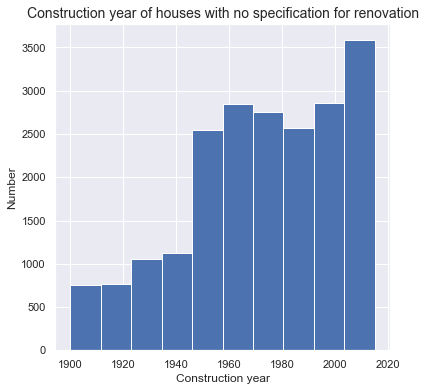

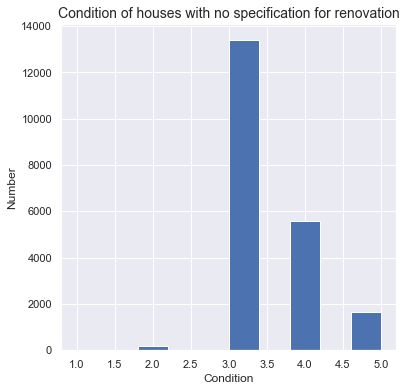

In [61]:
sns.set()
yr_built_nan.hist(figsize=[6,6]);
plt.title('Construction year of houses with no specification for renovation', fontsize=14)
plt.xlabel('Construction year')
plt.ylabel('Number')
condition_nan.hist(figsize=[6,6]);
plt.title('Condition of houses with no specification for renovation', fontsize=14)
plt.xlabel('Condition')
plt.ylabel('Number');

## 3.1 Find outliers

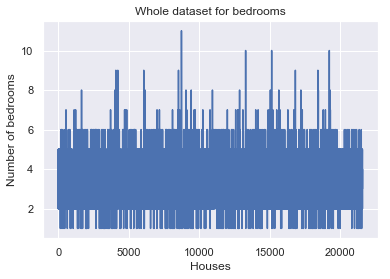

In [62]:
plt.plot(data.iloc[:,3])                 # column bedrooms has an outlier ... 33 bedrooms
plt.title('Whole dataset for bedrooms')
plt.xlabel('Houses')
plt.ylabel('Number of bedrooms')

data['bedrooms'] = data['bedrooms'].replace(33,3)

In [63]:
# find nonsence data
data[(data.sqft_lot < data.sqft_living) & (data.floors < 1.5)] 

# drop row 13265... sqft_lot is smaller than living area over 1 floor! without a basement

data =data.drop(data.index[13265])
data[(data.sqft_lot < data.sqft_living) & (data.floors < 1.5)]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,sqft_price
1547,8816400885,2014-10-08,450000.0,4,1.75,1640,1480.0,1.0,0.0,0.0,...,820,820,1912,0.0,98105,47.6684,-122.314,1420,2342.0,274.390244
13240,2877104196,2014-12-06,760000.0,3,2.00,1780,1750.0,1.0,0.0,2.0,...,1400,380,1927,2014.0,98103,47.6797,-122.357,1780,3750.0,426.966292
16917,5016002275,2014-06-02,610000.0,5,2.50,3990,3839.0,1.0,0.0,0.0,...,1990,2000,1962,0.0,98112,47.6236,-122.299,2090,5000.0,152.882206


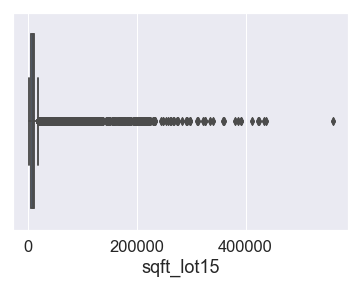

In [106]:
# The square footage of the land lots of the nearest 15 neighbors 
plt.plot(data.iloc[:,20])            
sns.boxplot(data.sqft_lot15)     # 2 outliers 

data = data.replace([871200, 858132], np.nan)
     
#sns.boxplot(data.sqft_lot15) 
data[data.sqft_lot15 > 600000]

sns.boxplot(data.sqft_lot15);

# 4 Data Visualization 

//anaconda3/envs/nf/lib/python3.6/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
//anaconda3/envs/nf/lib/python3.6/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


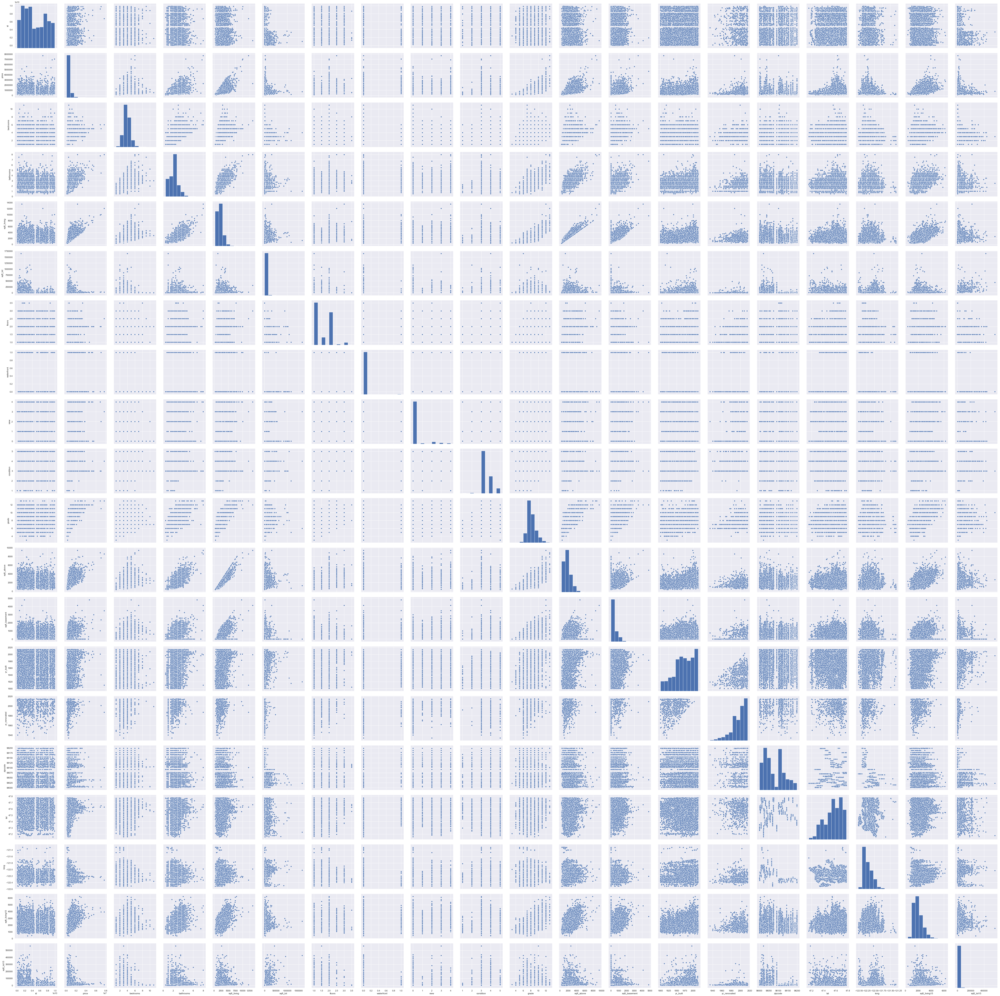

In [680]:
cols = data.columns

#for i in data.columns:
   # plt.figure()
   # plt.plot(data[i])

sns.set()
sns.pairplot(data[cols], height = 3.5)
plt.show();
    

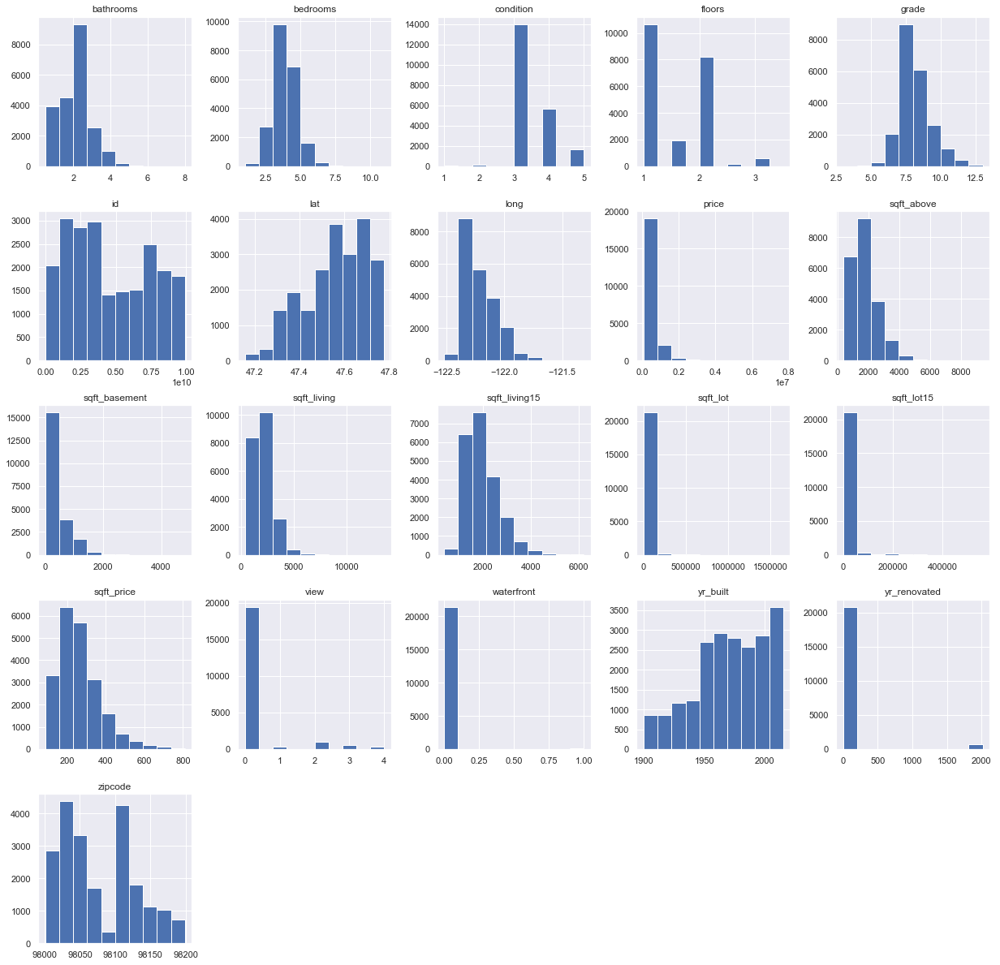

In [66]:
data.hist(figsize=[21,21]);

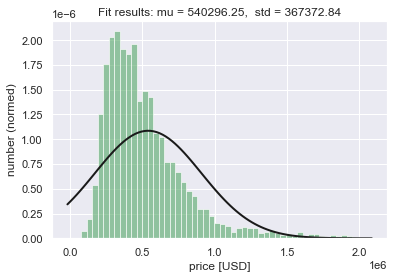

In [67]:
# Distribution of sale price < 2.000.000 USD

plt.hist(data[data['price'] < 2000000].price, bins=50, alpha=0.6, density=True, color='g');

mu = norm.fit(data.price)
μ = mu[0]
σ = mu[1]
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, μ, σ)
plt.plot(x, p, 'k', linewidth=2);
title = "Fit results: mu = {:.2f},  std = {:.2f}".format(μ, σ)
plt.title(title)
plt.xlabel('price [USD]')
plt.ylabel('number (normed)')
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
plt.savefig('Distprice.png', dpi=500);
# The min house-price is 78.000 USD and the max house-price is 7.700.000 USD

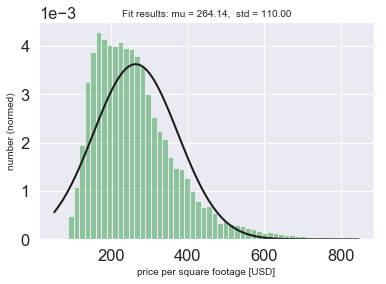

In [96]:
# Distribution Plot for sale price per sqft_living 

data2 = data.price/data.sqft_living
data3 = data
data3['sqft_price'] = data2
plt.hist(data3.sqft_price, bins=50, alpha=0.6, density=True, color='g');

mu = norm.fit(data3.sqft_price)
μ = mu[0]
σ = mu[1]
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, μ, σ)
plt.plot(x, p, 'k', linewidth=2);
title = "Fit results: mu = {:.2f},  std = {:.2f}".format(μ, σ)
plt.title(title, fontsize=10)
plt.xlabel('price per square footage [USD]', fontsize=10)
plt.ylabel('number (normed)', fontsize=10)
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
plt.savefig('Distlivingrice.png', dpi=500)

# The mean sqft-price is 264 USD, min = 87 USD and max = 810 USD! BIG difference! 

In [69]:
mu

(264.1372903973216, 110.00071723105128)

In [70]:
data3.sqft_price.describe()

count    21595.000000
mean       264.137290
std        110.003264
min         87.588235
25%        182.291667
50%        244.609060
75%        318.330013
max        810.138889
Name: sqft_price, dtype: float64

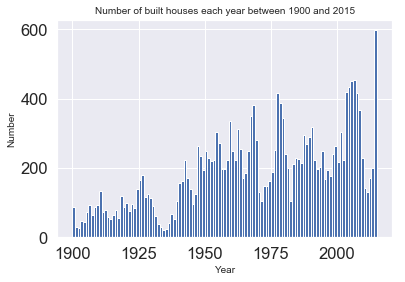

In [100]:
# Histogram of year built and renovated  TO DO!!!

bins = max(data.yr_built) - min(data.yr_built)
plt.hist(data.yr_built, bins=bins) 
plt.title('Number of built houses each year between 1900 and 2015', fontsize=10)
plt.ylabel('Number', fontsize=10)
plt.xlabel('Year', fontsize=10)
plt.savefig('Builthouse.png', dpi=500);

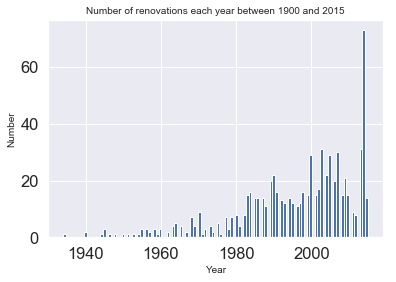

In [101]:
renovated = data.yr_renovated[data.yr_renovated >0]
renovated.shape         # only 744 houses have information about renovation year
plt.hist(renovated,bins=bins);
plt.title('Number of renovations each year between 1900 and 2015', fontsize=10)
plt.ylabel('Number', fontsize=10)
plt.xlabel('Year', fontsize=10)
plt.savefig('Renovatehouse.png', dpi=500);

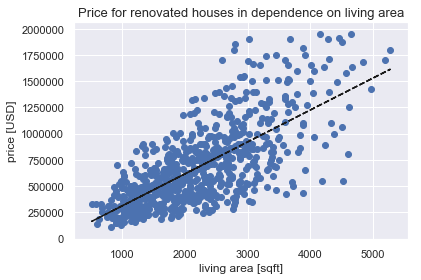

In [73]:
# plot for price for renovated houses against living area
data0 = data[data.price < 2000000]
renovated_full = data0[data0.yr_renovated >0]

coef = np.polyfit(renovated_full.sqft_living, renovated_full.price, 1)
poly = np.poly1d(coef)
plt.plot(renovated_full.sqft_living, poly(renovated_full.sqft_living), '--k')

plt.scatter(renovated_full.sqft_living, renovated_full.price)
plt.title('Price for renovated houses in dependence on living area', fontsize=13)
plt.ylabel('price [USD]', fontsize=12)
plt.xlabel('living area [sqft]', fontsize=12);

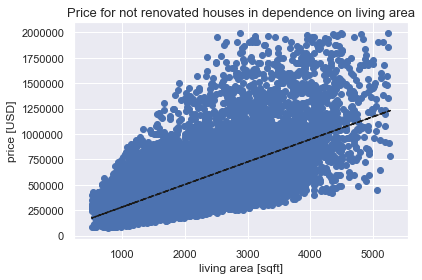

In [74]:
# plot for price for non-renovated houses against living area
data['yr_renovated'] = data['yr_renovated'].replace(np.nan, 0)
data00 = data[data.price < 2000000]
data00 = data00[data00.yr_renovated ==0] 
data00 = data00[data00.sqft_living <= max(renovated_full.sqft_living)]
data00 = data00[data00.sqft_living >= min(renovated_full.sqft_living)]

coef2 = np.polyfit(data00.sqft_living, data00.price, 1)
poly2 = np.poly1d(coef2)
plt.plot(data00.sqft_living, poly2(data00.sqft_living), '--k')
plt.scatter(data00.sqft_living, data00.price)
plt.title('Price for not renovated houses in dependence on living area', fontsize=13)
plt.ylabel('price [USD]', fontsize=12)
plt.xlabel('living area [sqft]', fontsize=12);

##sns.regplot(x="sqft_living", y="price", data=data00)  # same plot

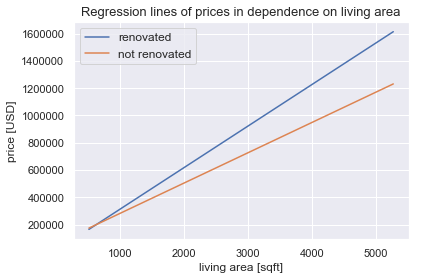

In [75]:
X = renovated_full.sqft_living.sort_values(ascending=True)
y_renovated = coef[0]*X + coef[1]
y_renovated = y_renovated.sort_values(ascending=True)

X1 = data00.sqft_living.sort_values(ascending=True)
y1 = coef2[0]*X1 + coef2[1]
y1 = y1.sort_values(ascending=True)

plt.plot(X,y_renovated)
plt.plot(X1,y1)
plt.title('Regression lines of prices in dependence on living area', fontsize=13)
plt.ylabel('price [USD]', fontsize=12)
plt.xlabel('living area [sqft]', fontsize=12)
plt.legend(('renovated','not renovated'),fontsize=12)
plt.savefig('Regression.png', dpi=500);


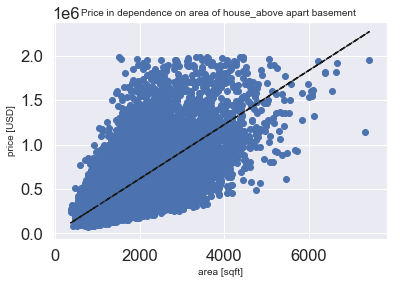

In [105]:
# plot for price all houses against living area
data000 = data[data.price < 2000000]

coef3 = np.polyfit(data000.sqft_above, data000.price, 1)
poly3 = np.poly1d(coef3)
plt.plot(data000.sqft_above, poly(data000.sqft_above), '--k')

plt.scatter(data000.sqft_above, data000.price)
plt.title('Price in dependence on area of house_above apart basement ', fontsize=10)
plt.ylabel('price [USD]', fontsize=10)
plt.xlabel('area [sqft]', fontsize=10)
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
plt.savefig('priceabove.png', dpi=500);

In [77]:
coef3

array([   211.23226315, 145633.84989404])

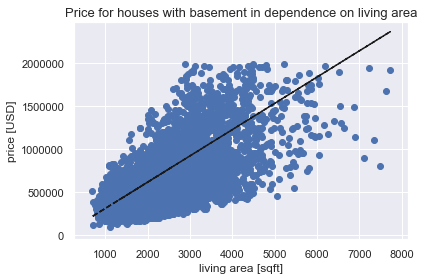

In [78]:
data0000 = data000[data000.sqft_basement >0]    # 8335 houses < 2mio. have a basement!

coef4 = np.polyfit(data0000.sqft_living, data0000.price, 1)
poly4 = np.poly1d(coef4)
plt.plot(data0000.sqft_living, poly(data0000.sqft_living), '--k')

plt.scatter(data0000.sqft_living, data0000.price)
plt.title('Price for houses with basement in dependence on living area', fontsize=13)
plt.ylabel('price [USD]', fontsize=12)
plt.xlabel('living area [sqft]', fontsize=12);

In [79]:
coef4

array([  237.31944611, 46180.23427039])

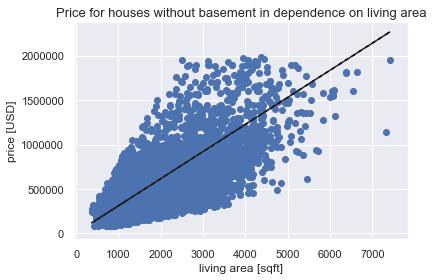

In [80]:
data_no_basement = data000[data000.sqft_basement == 0]    # 13053 houses < 2mio. have no basements

coef5 = np.polyfit(data_no_basement.sqft_living, data_no_basement.price, 1)
poly5 = np.poly1d(coef5)
plt.plot(data_no_basement.sqft_living, poly(data_no_basement.sqft_living), '--k')

plt.scatter(data_no_basement.sqft_living, data_no_basement.price)
plt.title('Price for houses without basement in dependence on living area', fontsize=13)
plt.ylabel('price [USD]', fontsize=12)
plt.xlabel('living area [sqft]', fontsize=12);

In [81]:
coef5

array([  212.9672641 , 69596.88225625])

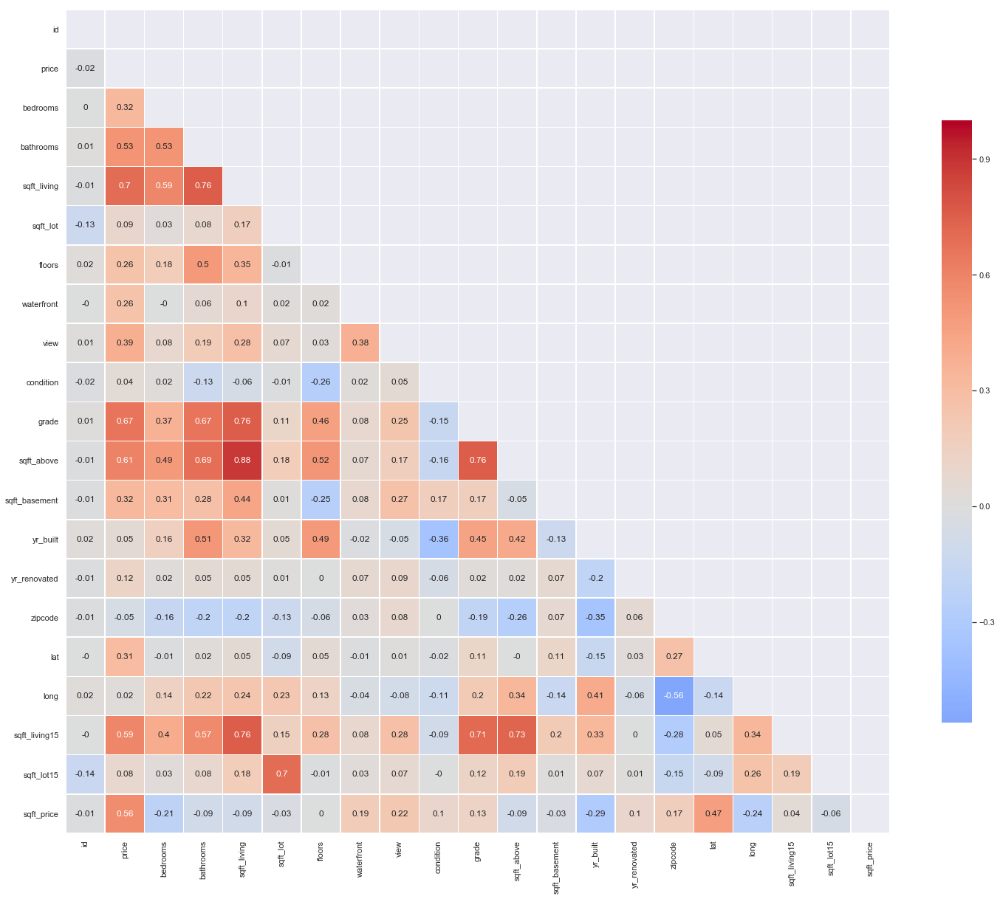

In [82]:
# Correlation between all features

corr = data.corr()
corr = corr.round(2)
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(25,30))

sns.heatmap(corr, mask=mask, cmap='coolwarm', vmax=1, center=0, square=True, linewidths=.5, 
            annot=True, cbar_kws={"shrink": .5});

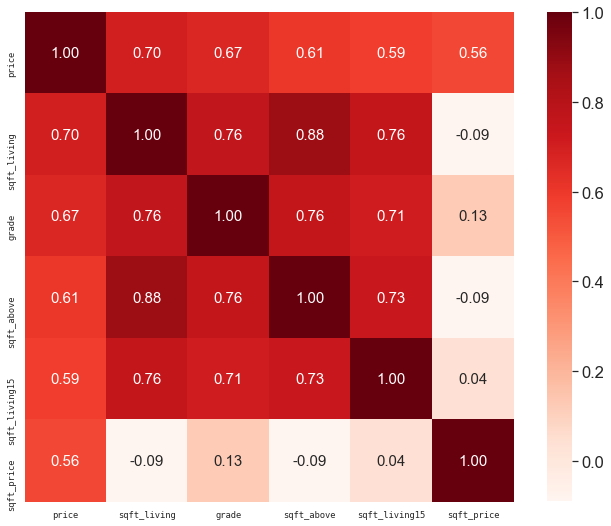

In [83]:
# plot the most correlated features

sns.set(context="paper", font="monospace")
corr_data = data.corr()
f, ax = plt.subplots(figsize=(12, 9))

k = 6 
cols = corr_data.nlargest(k, 'price')['price'].index
cm = np.corrcoef(data[cols].values.T)
sns.set(font_scale=1.5)
hm = sns.heatmap(cm, cbar=True, annot=True, cmap='Reds',square=True, fmt='.2f', 
                 annot_kws={'size': 15}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

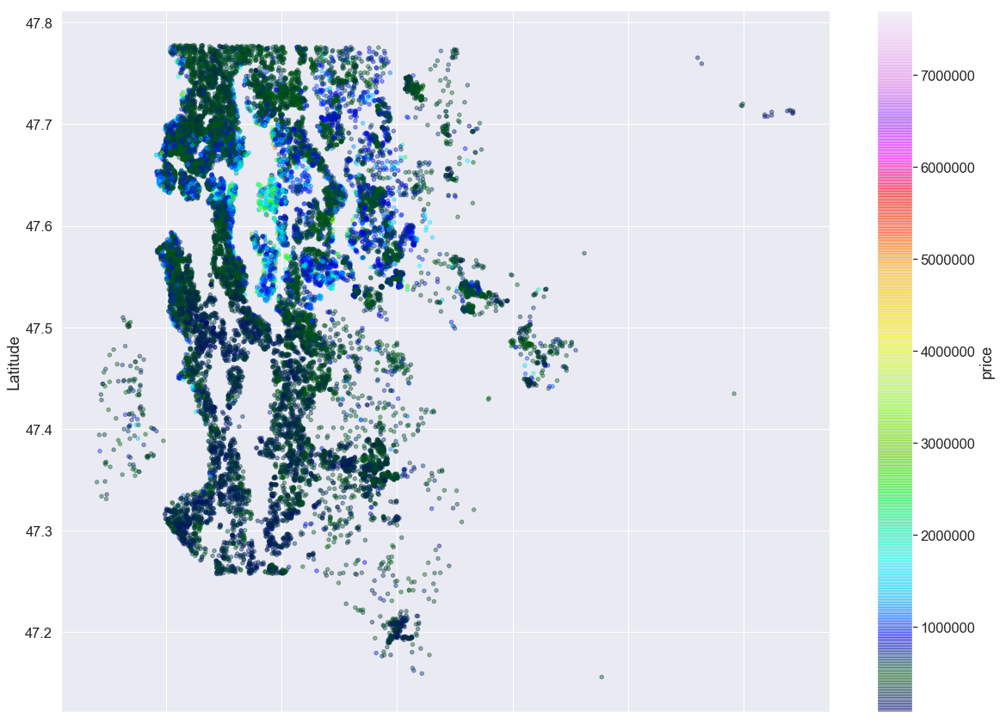

In [84]:
# Map of sale prices

data.plot(kind="scatter", x="long", y="lat", c="price", cmap="gist_ncar", colorbar=True,
       alpha=0.4, figsize=(20,15))
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.show

In [85]:
sum(data.price >= 2000000)

208

(21387, 22) (21595, 22)


<function matplotlib.pyplot.show(*args, **kw)>

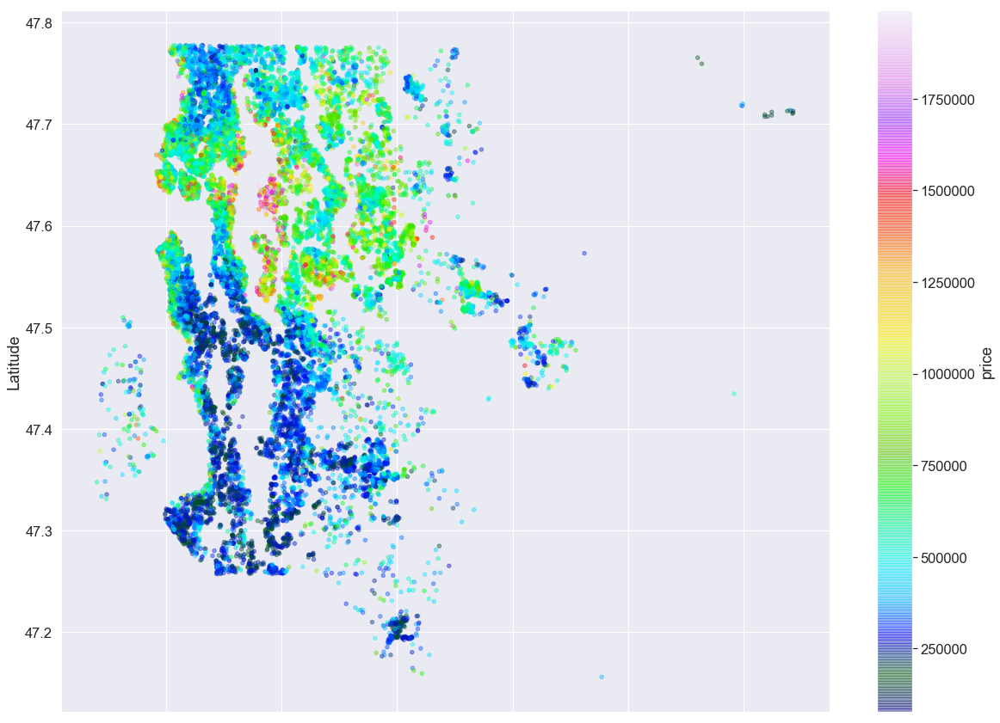

In [86]:
# Scatter plot of house prices under 2 mio. USD to get same magnitude of distribution like sqft_price
# excluding 198 houses

price_index = data[data.price >= 2000000].index.tolist()

data4 = data.drop(price_index)
print(data4.shape,
      data.shape)

data4.plot(kind="scatter", x="long", y="lat", c="price", cmap="gist_ncar", colorbar=True,
       alpha=0.4, figsize=(20,15))
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.show

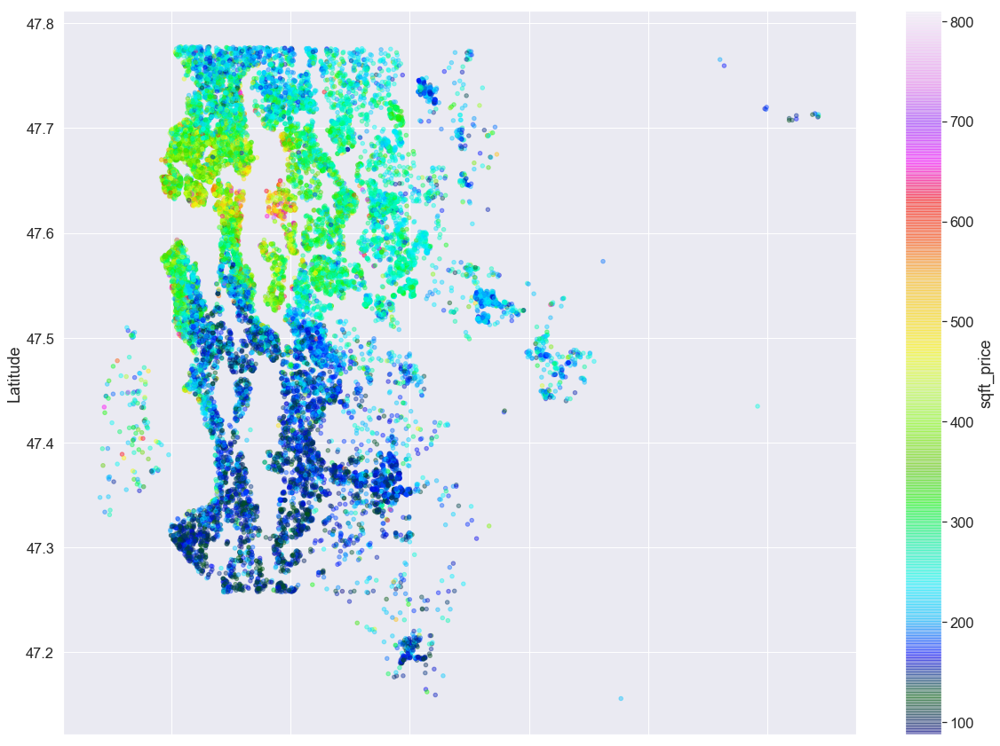

In [87]:
# Map of sqft_price

data5 = data4.price/data4.sqft_living
data4['sqft_price'] = data5


data4.plot(kind="scatter", x="long", y="lat", c="sqft_price", cmap="gist_ncar", colorbar=True,
       alpha=0.4, figsize=(20,15))
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.show;

In [46]:
data4.sqft_price.describe()   # cutted dataset (houses < 2mio.), 21389 houses of 21597

count    21388.000000
mean       261.223091
std        105.812599
min         87.588235
25%        181.715580
50%        243.613622
75%        315.490638
max        810.138889
Name: sqft_price, dtype: float64

In [47]:
data3.sqft_price.describe()     # original data, 21597 houses

count    21596.000000
mean       264.140956
std        110.002036
min         87.588235
25%        182.291667
50%        244.626805
75%        318.341837
max        810.138889
Name: sqft_price, dtype: float64

In [48]:
data6 = data3[data3.price >= 2000000]   # 208 houses
data6.sqft_price.describe()

count    208.000000
mean     564.176049
std      119.323750
min      168.389956
25%      472.739577
50%      565.293378
75%      659.856850
max      800.000000
Name: sqft_price, dtype: float64

In [49]:
data3[data3.sqft_price == max(data3.sqft_price)]  # 1080 sqft ≈ 100 sq. meters, built in 1940

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,sqft_price
19321,6021500970,2015-04-07,874950.0,2,1.0,1080,4000.0,1.0,0.0,0.0,...,1080,0,1940,0.0,98117,47.6902,-122.387,1530,4240.0,810.138889


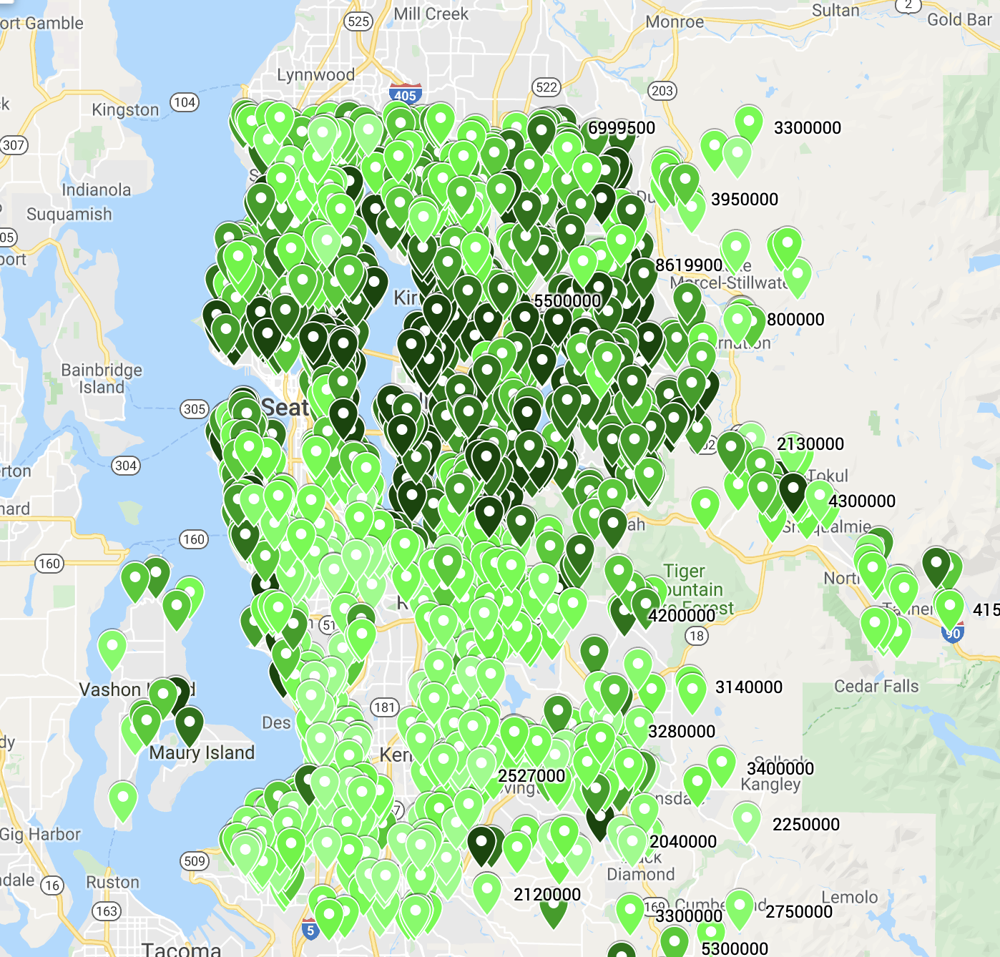

In [50]:
from IPython.display import display, Image
display(Image(filename='/Users/dennisaschenbrenner/Desktop/Seattle.png'))

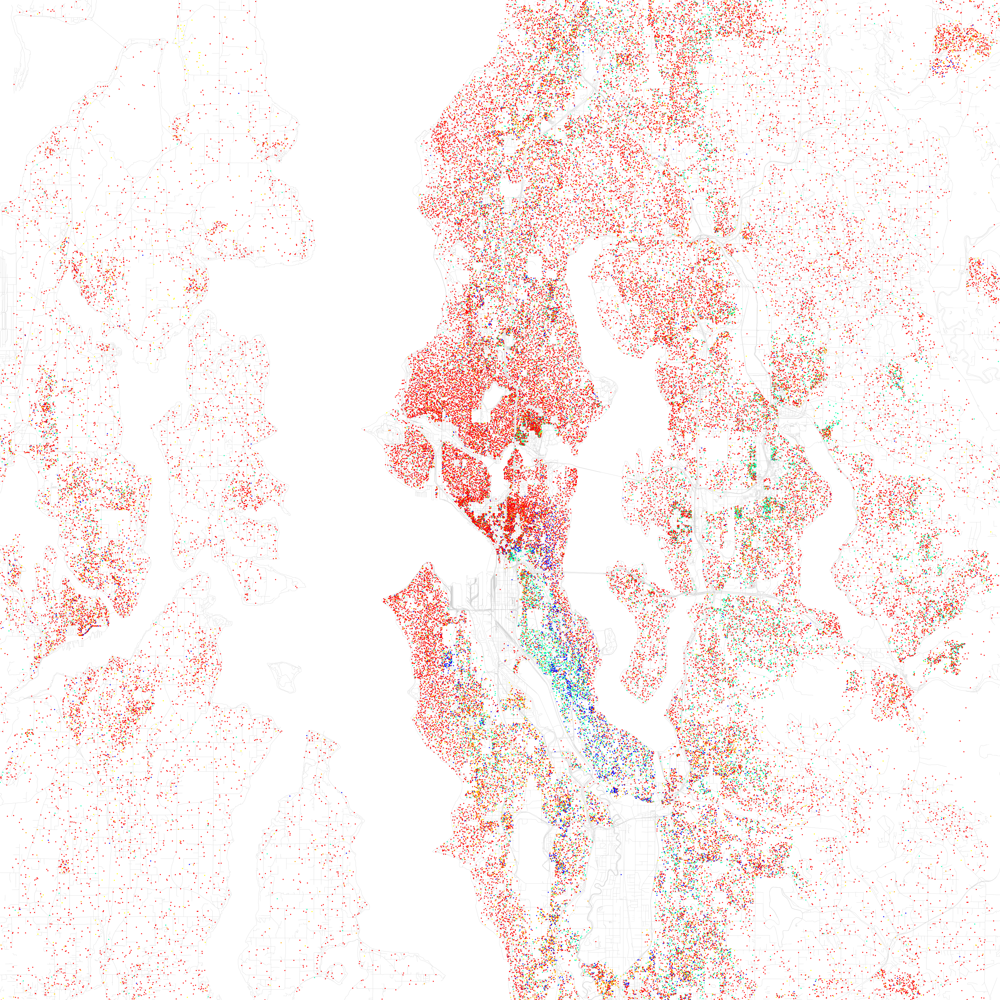

In [51]:
from IPython.display import display, Image
display(Image(filename='/Users/dennisaschenbrenner/Desktop/Ethnicity.png'))

## Modelling

In [52]:
# Modelling with all correlated features >0.4  # 12 significant features
 
model = 'price ~ sqft_living + sqft_above + sqft_living15 + bathrooms + C(grade) + sqft_living15 + C(zipcode) + yr_built + condition + floors + view +sqft_basement + yr_renovated'
smf.ols(formula=model, data=data).fit().summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.814
Model:                            OLS   Adj. R-squared:                  0.814
Method:                 Least Squares   F-statistic:                     1072.
Date:                Sat, 09 Nov 2019   Prob (F-statistic):               0.00
Time:                        20:43:40   Log-Likelihood:            -2.8919e+05
No. Observations:               21596   AIC:                         5.786e+05
Df Residuals:                   21507   BIC:                         5.793e+05
Df Model:                          88                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept            6.241e+05   2.02e+05      3.086      0.002    2.28e+05    1.02e+06
C(grade)[T.4]       -1.437e+05   1.62e+05     -0.887      0.375   -4.61e+05    1.74e+05
C(grade)[T.5]       -1.773e+05   1.59e+05     -1.113      0.266    -4.9e+05    1.35e+05
C(grade)[T.6]       -1.881e+05   1.59e+05     -1.183      0.237      -5e+05    1.24e+05
C(grade)[T.7]       -1.877e+05   1.59e+05     -1.180      0.238   -4.99e+05    1.24e+05
C(grade)[T.8]       -1.637e+05   1.59e+05     -1.029      0.303   -4.76e+05    1.48e+05
C(grade)[T.9]       -8.948e+04   1.59e+05     -0.562      0.574   -4.01e+05    2.22e+05
C(grade)[T.10]       4.316e+04   1.59e+05      0.271      0.786   -2.69e+05    3.55e+05
C(grade)[T.11]       2.525e+05   1.59e+05      1.583      0.113   -6.01e+04    5.65e+05
C(grade)[T.12]       7.056e+05    1.6e+05      4.401      0.000    3.91e+05    1.02e+06
C(grade)[T.13]       1.739e+06   1.66e+05     10.493      0.000    1.41e+06    2.06e+06
C(zipcode)[T.98002]  2262.6901   1.41e+04      0.161      0.872   -2.53e+04    2.98e+04
C(zipcode)[T.98003] -9925.0131   1.27e+04     -0.784      0.433   -3.47e+04    1.49e+04
C(zipcode)[T.98004]  7.588e+05   1.24e+04     61.180      0.000    7.34e+05    7.83e+05
C(zipcode)[T.98005]   3.06e+05    1.5e+04     20.416      0.000    2.77e+05    3.35e+05
C(zipcode)[T.98006]  2.365e+05   1.12e+04     21.089      0.000    2.15e+05    2.59e+05
C(zipcode)[T.98007]  2.496e+05   1.58e+04     15.788      0.000    2.19e+05    2.81e+05
C(zipcode)[T.98008]  2.686e+05   1.27e+04     21.219      0.000    2.44e+05    2.93e+05
C(zipcode)[T.98010]  6.247e+04    1.8e+04      3.478      0.001    2.73e+04    9.77e+04
C(zipcode)[T.98011]  1.392e+05   1.41e+04      9.847      0.000    1.11e+05    1.67e+05
C(zipcode)[T.98014]  1.059e+05   1.66e+04      6.397      0.000    7.34e+04    1.38e+05
C(zipcode)[T.98019]  1.053e+05   1.42e+04      7.390      0.000    7.74e+04    1.33e+05
C(zipcode)[T.98022] -1.929e+04   1.34e+04     -1.439      0.150   -4.56e+04    6986.185
C(zipcode)[T.98023] -2.547e+04    1.1e+04     -2.318      0.020    -4.7e+04   -3936.816
C(zipcode)[T.98024]  1.637e+05   1.96e+04      8.337      0.000    1.25e+05    2.02e+05
C(zipcode)[T.98027]  1.736e+05   1.15e+04     15.061      0.000    1.51e+05    1.96e+05
C(zipcode)[T.98028]  1.354e+05   1.26e+04     10.725      0.000    1.11e+05     1.6e+05
C(zipcode)[T.98029]  2.248e+05   1.23e+04     18.295      0.000    2.01e+05    2.49e+05
C(zipcode)[T.98030]  8828.9697    1.3e+04      0.681      0.496   -1.66e+04    3.42e+04
C(zipcode)[T.98031]  1.792e+04   1.27e+04      1.407      0.159   -7046.276    4.29e+04
C(zipcode)[T.98032]   265.6014   1.65e+04      0.016      0.987   -3.21e+04    3.26e+04
C(zipcode)[T.98033]  3.591e+05   1.14e+04     31.585      0.000    3.37e+05    3.81e+05
C(z

In [53]:
# MODEL 2

# Modelling with the 6 MOST significant features

model = 'price ~ bathrooms + sqft_living + C(grade) + sqft_above + sqft_living15 + C(zipcode)'
smf.ols(formula=model, data=data).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.784
Model:                            OLS   Adj. R-squared:                  0.783
Method:                 Least Squares   F-statistic:                     941.9
Date:                Sat, 09 Nov 2019   Prob (F-statistic):               0.00
Time:                        20:43:45   Log-Likelihood:            -2.9082e+05
No. Observations:               21596   AIC:                         5.818e+05
Df Residuals:                   21512   BIC:                         5.825e+05
Df Model:                          83                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept            7.924e+04   1.72e+05      0.462      0.644   -2.57e+05    4.16e+05
C(grade)[T.4]        -1.32e+05   1.75e+05     -0.757      0.449   -4.74e+05     2.1e+05
C(grade)[T.5]       -1.618e+05   1.72e+05     -0.942      0.346   -4.98e+05    1.75e+05
C(grade)[T.6]       -1.816e+05   1.71e+05     -1.059      0.289   -5.18e+05    1.54e+05
C(grade)[T.7]       -1.932e+05   1.71e+05     -1.127      0.260   -5.29e+05    1.43e+05
C(grade)[T.8]       -1.748e+05   1.71e+05     -1.020      0.308   -5.11e+05    1.61e+05
C(grade)[T.9]        -9.91e+04   1.71e+05     -0.578      0.563   -4.35e+05    2.37e+05
C(grade)[T.10]        4.07e+04   1.72e+05      0.237      0.813   -2.96e+05    3.77e+05
C(grade)[T.11]       2.656e+05   1.72e+05      1.546      0.122   -7.12e+04    6.02e+05
C(grade)[T.12]       7.447e+05   1.73e+05      4.312      0.000    4.06e+05    1.08e+06
C(grade)[T.13]       1.787e+06   1.79e+05     10.007      0.000    1.44e+06    2.14e+06
C(zipcode)[T.98002]  2.155e+04   1.51e+04      1.423      0.155   -8125.637    5.12e+04
C(zipcode)[T.98003]  1232.9438   1.36e+04      0.090      0.928   -2.55e+04     2.8e+04
C(zipcode)[T.98004]  7.588e+05   1.33e+04     56.987      0.000    7.33e+05    7.85e+05
C(zipcode)[T.98005]  2.975e+05   1.61e+04     18.501      0.000    2.66e+05    3.29e+05
C(zipcode)[T.98006]   2.54e+05   1.21e+04     21.060      0.000     2.3e+05    2.78e+05
C(zipcode)[T.98007]  2.486e+05    1.7e+04     14.613      0.000    2.15e+05    2.82e+05
C(zipcode)[T.98008]  3.069e+05   1.36e+04     22.560      0.000     2.8e+05    3.34e+05
C(zipcode)[T.98010]  7.037e+04   1.93e+04      3.638      0.000    3.25e+04    1.08e+05
C(zipcode)[T.98011]   1.21e+05   1.52e+04      7.943      0.000    9.11e+04    1.51e+05
C(zipcode)[T.98014]  1.041e+05   1.78e+04      5.838      0.000    6.92e+04    1.39e+05
C(zipcode)[T.98019]  8.235e+04   1.53e+04      5.365      0.000    5.23e+04    1.12e+05
C(zipcode)[T.98022]   4.76e+04   1.44e+04      3.307      0.001    1.94e+04    7.58e+04
C(zipcode)[T.98023] -2.609e+04   1.18e+04     -2.204      0.028   -4.93e+04   -2887.834
C(zipcode)[T.98024]   1.73e+05   2.12e+04      8.173      0.000    1.31e+05    2.14e+05
C(zipcode)[T.98027]  1.547e+05   1.24e+04     12.470      0.000     1.3e+05    1.79e+05
C(zipcode)[T.98028]  1.298e+05   1.36e+04      9.545      0.000    1.03e+05    1.56e+05
C(zipcode)[T.98029]  2.054e+05   1.32e+04     15.531      0.000     1.8e+05    2.31e+05
C(zipcode)[T.98030]   133.3408    1.4e+04      0.010      0.992   -2.73e+04    2.75e+04
C(zipcode)[T.98031]  1.391e+04   1.37e+04      1.013      0.311    -1.3e+04    4.08e+04
C(zipcode)[T.98032]  1.085e+04   1.78e+04      0.611      0.541    -2.4e+04    4.57e+04
C(zipcode)[T.98033]  3.698e+05   1.22e+04     30.213      0.000    3.46e+05    3.94e+05
C(z

In [54]:
data3 = data

In [55]:
# Drop all zipcodes with high p-value 
# 98003 98002 98030 98031 98032 98042
zipcodes = (98003, 98002, 98030, 98031, 98032, 98042)
zip_index = data[data.zipcode == 98042].index.tolist()

data3 = data3.drop(zip_index)


In [56]:

data3.shape

(21049, 22)

In [57]:
sum(data3['zipcode']==98042)   # check it!


0

In [58]:
# MODEL 3: dropped zipcodes with high p-values

model = 'price ~ bathrooms + sqft_living + C(grade) + sqft_above + sqft_living15 + C(zipcode)'
smf.ols(formula=model, data=data3).fit().summary()
# result: not better!

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.784
Model:                            OLS   Adj. R-squared:                  0.783
Method:                 Least Squares   F-statistic:                     925.3
Date:                Sat, 09 Nov 2019   Prob (F-statistic):               0.00
Time:                        20:43:57   Log-Likelihood:            -2.8363e+05
No. Observations:               21049   AIC:                         5.674e+05
Df Residuals:                   20966   BIC:                         5.681e+05
Df Model:                          82                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept             7.62e+04   1.73e+05      0.440      0.660   -2.63e+05    4.15e+05
C(grade)[T.4]       -1.302e+05   1.76e+05     -0.739      0.460   -4.75e+05    2.15e+05
C(grade)[T.5]       -1.667e+05   1.73e+05     -0.962      0.336   -5.06e+05    1.73e+05
C(grade)[T.6]       -1.852e+05   1.73e+05     -1.072      0.284   -5.24e+05    1.54e+05
C(grade)[T.7]       -1.966e+05   1.73e+05     -1.138      0.255   -5.35e+05    1.42e+05
C(grade)[T.8]       -1.775e+05   1.73e+05     -1.027      0.304   -5.16e+05    1.61e+05
C(grade)[T.9]       -1.022e+05   1.73e+05     -0.591      0.555   -4.41e+05    2.37e+05
C(grade)[T.10]       3.628e+04   1.73e+05      0.210      0.834   -3.03e+05    3.75e+05
C(grade)[T.11]       2.588e+05   1.73e+05      1.494      0.135   -8.08e+04    5.98e+05
C(grade)[T.12]       7.331e+05   1.74e+05      4.209      0.000    3.92e+05    1.07e+06
C(grade)[T.13]       1.771e+06    1.8e+05      9.834      0.000    1.42e+06    2.12e+06
C(zipcode)[T.98002]  2.281e+04   1.53e+04      1.494      0.135   -7112.021    5.27e+04
C(zipcode)[T.98003]  1132.7831   1.37e+04      0.082      0.934   -2.58e+04    2.81e+04
C(zipcode)[T.98004]  7.563e+05   1.34e+04     56.308      0.000     7.3e+05    7.83e+05
C(zipcode)[T.98005]  2.953e+05   1.62e+04     18.206      0.000    2.64e+05    3.27e+05
C(zipcode)[T.98006]  2.514e+05   1.22e+04     20.665      0.000    2.28e+05    2.75e+05
C(zipcode)[T.98007]  2.476e+05   1.72e+04     14.435      0.000    2.14e+05    2.81e+05
C(zipcode)[T.98008]  3.063e+05   1.37e+04     22.326      0.000    2.79e+05    3.33e+05
C(zipcode)[T.98010]  6.963e+04   1.95e+04      3.569      0.000    3.14e+04    1.08e+05
C(zipcode)[T.98011]  1.196e+05   1.54e+04      7.787      0.000    8.95e+04     1.5e+05
C(zipcode)[T.98014]  1.035e+05    1.8e+04      5.755      0.000    6.83e+04    1.39e+05
C(zipcode)[T.98019]  8.126e+04   1.55e+04      5.250      0.000    5.09e+04    1.12e+05
C(zipcode)[T.98022]  4.767e+04   1.45e+04      3.284      0.001    1.92e+04    7.61e+04
C(zipcode)[T.98023] -2.645e+04   1.19e+04     -2.215      0.027   -4.98e+04   -3048.883
C(zipcode)[T.98024]  1.716e+05   2.13e+04      8.043      0.000     1.3e+05    2.13e+05
C(zipcode)[T.98027]   1.53e+05   1.25e+04     12.223      0.000    1.28e+05    1.77e+05
C(zipcode)[T.98028]   1.29e+05   1.37e+04      9.404      0.000    1.02e+05    1.56e+05
C(zipcode)[T.98029]  2.039e+05   1.33e+04     15.285      0.000    1.78e+05     2.3e+05
C(zipcode)[T.98030]  -165.9584   1.41e+04     -0.012      0.991   -2.78e+04    2.75e+04
C(zipcode)[T.98031]  1.377e+04   1.38e+04      0.995      0.320   -1.34e+04    4.09e+04
C(zipcode)[T.98032]  1.144e+04   1.79e+04      0.638      0.523   -2.37e+04    4.66e+04
C(zipcode)[T.98033]  3.686e+05   1.23e+04     29.859      0.000    3.44e+05    3.93e+05
C(z

In [59]:
# Normalization


scaler = preprocessing.StandardScaler()
data22 = data.drop(['date'],axis=1)
scaled_df = scaler.fit_transform(data22)
scaled_df = pd.DataFrame(scaled_df, columns=data22.columns)
                         
smf.ols(formula=model, data=scaled_df).fit().summary()

# Normalized data has no impact on R^2

//anaconda3/envs/nf/lib/python3.6/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
//anaconda3/envs/nf/lib/python3.6/site-packages/sklearn/base.py:462: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.784
Model:                            OLS   Adj. R-squared:                  0.783
Method:                 Least Squares   F-statistic:                     941.9
Date:                Sat, 09 Nov 2019   Prob (F-statistic):               0.00
Time:                        20:44:01   Log-Likelihood:                -14085.
No. Observations:               21596   AIC:                         2.834e+04
Df Residuals:                   21512   BIC:                         2.901e+04
Df Model:                          83                                         
Covariance Type:            nonrobust                                         
=======================================================================================================
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                              -0.1316      0.467     -0.282      0.778      -1.047       0.784
C(grade)[T.-3.117945447824215]         -0.3594      0.475     -0.757      0.449      -1.290       0.572
C(grade)[T.-2.2655694096048933]        -0.4405      0.467     -0.942      0.346      -1.357       0.476
C(grade)[T.-1.4131933713855716]        -0.4942      0.467     -1.059      0.289      -1.409       0.420
C(grade)[T.-0.56081733316625]          -0.5258      0.467     -1.127      0.260      -1.440       0.389
C(grade)[T.0.2915587050530715]         -0.4758      0.467     -1.020      0.308      -1.390       0.439
C(grade)[T.1.143934743272393]          -0.2698      0.467     -0.578      0.563      -1.185       0.645
C(grade)[T.1.9963107814917145]          0.1108      0.467      0.237      0.813      -0.805       1.026
C(grade)[T.2.848686819711036]           0.7231      0.468      1.546      0.122      -0.194       1.640
C(grade)[T.3.7010628579303577]          2.0272      0.470      4.312      0.000       1.106       2.949
C(grade)[T.4.553438896149679]           4.8632      0.486     10.007      0.000       3.911       5.816
C(zipcode)[T.-1.4192987745305006]       0.0587      0.041      1.423      0.155      -0.022       0.139
C(zipcode)[T.-1.4006114029686263]       0.0034      0.037      0.090      0.928      -0.069       0.076
C(zipcode)[T.-1.3819240314067518]       2.0656      0.036     56.987      0.000       1.995       2.137
C(zipcode)[T.-1.3632366598448773]       0.8099      0.044     18.501      0.000       0.724       0.896
C(zipcode)[T.-1.3445492882830028]       0.6913      0.033     21.060      0.000       0.627       0.756
C(zipcode)[T.-1.3258619167211285]       0.6766      0.046     14.613      0.000       0.586       0.767
C(zipcode)[T.-1.307174545159254]        0.8355      0.037     22.560      0.000       0.763       0.908
C(zipcode)[T.-1.2697998020355052]       0.1916      0.053      3.638      0.000       0.088       0.295
C(zipcode)[T.-1.2511124304736307]       0.3293      0.041      7.943      0.000       0.248       0.411
C(zipcode)[T.-1.1950503157880075]       0.2835      0.049      5.838      0.000       0.188       0.379
C(zipcode)[T.-1.1016134579786352]       0.2242      0.042      5.365      0.000       0.142       0.306
C(zipcode)[T.-1.045551343293012]        0.1296      0.039      3.307      0.001       0.053       0.206
C(zipcode)[T.-1.0268639717311376]      -0.0710      0.032     -2.204      0.028      -0.134      -0.008
C(zipcode)[T.-1.0081766001692631]       0.4708      0.058      8.173      0.000       0.358       0.584
C(zipcode)[T.-0.9521144854836397]       0.4212      0.034     12.470      0.000       0.355       0.487
C(zipcode)[T.-0.9334271139217654]       0.3533      0.037      9.54

In [60]:
# MODEL 4: add predictor variable -  price per square feet/square foot

model = 'price ~ bathrooms + sqft_living + C(grade) + sqft_above + sqft_living15 + C(zipcode) + sqft_price'
smf.ols(formula=model, data=data).fit().summary()
# senceless, because sqft_price has "price" partly in it (price/living)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.905
Model:                            OLS   Adj. R-squared:                  0.905
Method:                 Least Squares   F-statistic:                     2440.
Date:                Sat, 09 Nov 2019   Prob (F-statistic):               0.00
Time:                        20:44:06   Log-Likelihood:            -2.8196e+05
No. Observations:               21596   AIC:                         5.641e+05
Df Residuals:                   21511   BIC:                         5.648e+05
Df Model:                          84                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept           -8.526e+05   1.14e+05     -7.478      0.000   -1.08e+06   -6.29e+05
C(grade)[T.4]        2.431e+05   1.16e+05      2.099      0.036    1.61e+04     4.7e+05
C(grade)[T.5]        3.164e+05   1.14e+05      2.776      0.006     9.3e+04     5.4e+05
C(grade)[T.6]        3.276e+05   1.14e+05      2.880      0.004    1.05e+05    5.51e+05
C(grade)[T.7]        3.306e+05   1.14e+05      2.906      0.004    1.08e+05    5.54e+05
C(grade)[T.8]        3.274e+05   1.14e+05      2.878      0.004    1.04e+05     5.5e+05
C(grade)[T.9]        3.421e+05   1.14e+05      3.006      0.003    1.19e+05    5.65e+05
C(grade)[T.10]           4e+05   1.14e+05      3.513      0.000    1.77e+05    6.23e+05
C(grade)[T.11]       5.098e+05   1.14e+05      4.471      0.000    2.86e+05    7.33e+05
C(grade)[T.12]       7.916e+05   1.15e+05      6.908      0.000    5.67e+05    1.02e+06
C(grade)[T.13]       1.544e+06   1.18e+05     13.033      0.000    1.31e+06    1.78e+06
C(zipcode)[T.98002]  2.608e+04      1e+04      2.596      0.009    6391.025    4.58e+04
C(zipcode)[T.98003] -8601.1772   9044.727     -0.951      0.342   -2.63e+04    9127.160
C(zipcode)[T.98004]  1.266e+05   9626.837     13.152      0.000    1.08e+05    1.45e+05
C(zipcode)[T.98005] -1.874e+04   1.08e+04     -1.728      0.084      -4e+04    2510.955
C(zipcode)[T.98006] -2.015e+04   8170.649     -2.467      0.014   -3.62e+04   -4138.071
C(zipcode)[T.98007] -1.887e+04   1.14e+04     -1.655      0.098   -4.12e+04    3477.883
C(zipcode)[T.98008]  1279.2807   9214.414      0.139      0.890   -1.68e+04    1.93e+04
C(zipcode)[T.98010] -3.748e+04   1.29e+04     -2.916      0.004   -6.27e+04   -1.23e+04
C(zipcode)[T.98011] -3.176e+04   1.01e+04     -3.131      0.002   -5.17e+04   -1.19e+04
C(zipcode)[T.98014]  -2.84e+04   1.19e+04     -2.394      0.017   -5.17e+04   -5143.261
C(zipcode)[T.98019] -2.887e+04   1.02e+04     -2.829      0.005   -4.89e+04   -8869.402
C(zipcode)[T.98022] -3154.4327   9556.076     -0.330      0.741   -2.19e+04    1.56e+04
C(zipcode)[T.98023]  -1.55e+04   7853.940     -1.973      0.048   -3.09e+04    -104.099
C(zipcode)[T.98024] -2.683e+04   1.41e+04     -1.904      0.057   -5.45e+04     786.498
C(zipcode)[T.98027] -4.367e+04   8319.829     -5.249      0.000      -6e+04   -2.74e+04
C(zipcode)[T.98028] -2.289e+04   9069.883     -2.524      0.012   -4.07e+04   -5114.346
C(zipcode)[T.98029] -1.993e+04   8881.274     -2.245      0.025   -3.73e+04   -2526.932
C(zipcode)[T.98030] -8631.5508   9273.317     -0.931      0.352   -2.68e+04    9544.840
C(zipcode)[T.98031] -8460.0665   9107.020     -0.929      0.353   -2.63e+04    9390.369
C(zipcode)[T.98032]  1.098e+04   1.18e+04      0.931      0.352   -1.21e+04    3.41e+04
C(zipcode)[T.98033] -3681.5094   8429.875     -0.437      0.662   -2.02e+04    1.28e+04
C(z

In [ ]:
'''''
Future Work:
Gain more knowledge about the dataset (Feature Engineering)

Find more additional data to generate a more robust prediction (ethnicity, crime rate, transport connection….)

Recommendations:
    
If you are a buyer:
Choose right location
Think about renovation
Think about a basement and living area
If you are a seller:
Try to maximize profit by comparing house prices in your location 
If your house has a large living area do renovation first (depends on costs)
House with a basement increases the house price! (+2k/100 sqft)
